### Notebook settings

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib widget

### Imports

In [436]:

import matplotlib.pyplot as plt
import numpy as np
import uproot
import logging
from rich import print

from tpvalidator.utilities import temporary_log_level, subplot_autogrid
import tpvalidator.datapool as dp
from tpvalidator.histograms import uproot_hist_mean_std


# Load ADC mean and standard deviation from wafevorm histograms

In [101]:
with uproot.open("../data/vd/ar39/100events/trigger_digits_waves_detsim_vd_ar39.root") as f:

    adc_hists = {}
    for k in f.keys():
        obj_name = k.split('/')[-1]

        if obj_name.startswith('ADCsPlane') or obj_name.startswith('ADCsNoisePlane'):
            adc_hists[obj_name.split(';')[0]] = f[k.split(';')[0]]

print(adc_hists)

{
    'ADCsPlaneX': <TH1I (version 3) at 0x0004cbb0e5f0>,
    'ADCsPlaneU': <TH1I (version 3) at 0x0004cbb0e190>,
    'ADCsPlaneV': <TH1I (version 3) at 0x0008185eea90>,
    'ADCsNoisePlaneX': <TH1I (version 3) at 0x0004bf3e9550>,
    'ADCsNoisePlaneU': <TH1I (version 3) at 0x0004bf3e9cd0>,
    'ADCsNoisePlaneV': <TH1I (version 3) at 0x00038e4eaf10>
}

## Plot ADC distributions, and 3 $\sigma$/5 $\sigma$ reference thresholds

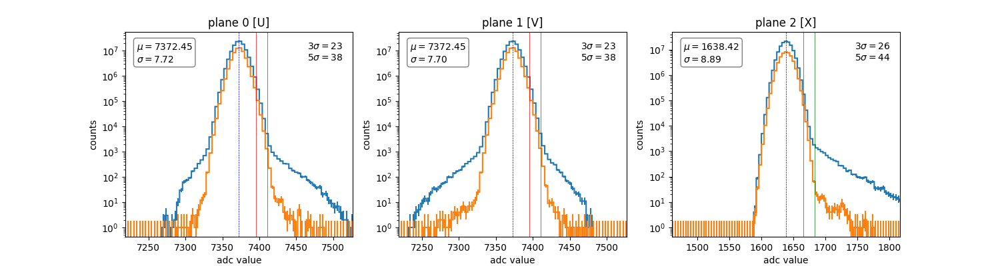

In [102]:

from rich.table import Table


# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)
view_range = 20
stat_x = 0.05
stat_y = 0.95
v_lw=0.5

thres_x = 0.8
thres_y = 0.95

# -- draw
fig,axes= plt.subplots(1,3, figsize=(15,4))


ax = axes[0]
adc_hists['ADCsPlaneU'].to_hist().plot(ax=ax)
adc_hists['ADCsNoisePlaneU'].to_hist().plot(ax=ax)
ax.set_xlabel('adc value')
ax.set_ylabel('counts')

mu, sigma = uproot_hist_mean_std(adc_hists['ADCsNoisePlaneU'])[0]
ax.set_xlim(mu-view_range*sigma, mu+view_range*sigma)
thrs_3s=mu+3*sigma
thrs_5s=mu+5*sigma

textstr = '\n'.join((
    f'$\\mu={mu:.2f}$',
    f'$\\sigma={sigma:.2f}$'))

# place a text box in top center in axes coords
ax.text(stat_x, stat_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left', bbox=props)

textstr = '\n'.join((
    f'$3\\sigma={int(3*sigma)}$',
    f'$5\\sigma={int(5*sigma)}$'
    ))
ax.text(thres_x, thres_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left')

ax.axvline(mu, color='b', ls='--', lw=v_lw)
ax.axvline(thrs_3s, color='r', lw=v_lw)
ax.axvline(thrs_5s, color='g', lw=v_lw)
ax.set_title('plane 0 [U]')

ax = axes[1]
adc_hists['ADCsPlaneV'].to_hist().plot(ax=ax)
adc_hists['ADCsNoisePlaneV'].to_hist().plot(ax=ax)
ax.set_xlabel('adc value')
ax.set_ylabel('counts')

mu, sigma = uproot_hist_mean_std(adc_hists['ADCsNoisePlaneV'])[0]
ax.set_xlim(mu-view_range*sigma, mu+view_range*sigma)
thrs_3s=mu+3*sigma
thrs_5s=mu+5*sigma

textstr = '\n'.join((
    f'$\\mu={mu:.2f}$',
    f'$\\sigma={sigma:.2f}$'))

# place a text box in top center in axes coords
ax.text(stat_x, stat_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left', bbox=props)

textstr = '\n'.join((
    f'$3\\sigma={int(3*sigma)}$',
    f'$5\\sigma={int(5*sigma)}$'
    ))
ax.text(thres_x, thres_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left')

ax.axvline(mu, color='b', ls='--', lw=v_lw)
ax.axvline(thrs_3s, color='r', lw=v_lw)
ax.axvline(thrs_5s, color='g', lw=v_lw)
ax.set_title('plane 1 [V]')


ax = axes[2]
adc_hists['ADCsPlaneX'].to_hist().plot(ax=ax)
adc_hists['ADCsNoisePlaneX'].to_hist().plot(ax=ax)
ax.set_xlabel('adc value')
ax.set_ylabel('counts')

mu, sigma = uproot_hist_mean_std(adc_hists['ADCsNoisePlaneX'])[0]
ax.set_xlim(mu-view_range*sigma, mu+view_range*sigma)
thrs_3s=mu+3*sigma
thrs_5s=mu+5*sigma

textstr = '\n'.join((
    f'$\\mu={mu:.2f}$',
    f'$\\sigma={sigma:.2f}$'))
# place a text box in top center in axes coords
ax.text(stat_x, stat_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left', bbox=props)

textstr = '\n'.join((
    f'$3\\sigma={int(3*sigma)}$',
    f'$5\\sigma={int(5*sigma)}$'
    ))
ax.text(thres_x, thres_y, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left')

ax.axvline(mu, color='b', ls='--', lw=v_lw)
ax.axvline(thrs_3s, color='r', lw=v_lw)
ax.axvline(thrs_5s, color='g', lw=v_lw)
ax.set_title('plane 2 [X]')

for ax in axes:
    ax.set_yscale("log")

### Utilities and helpers

In [105]:
class TPPreSelection:

    def __init__(self, tps):
        self.p0 = tps[tps.TP_plane == 0]
        self.p1 = tps[tps.TP_plane == 1]
        self.p2 = tps[tps.TP_plane == 2]


        self.sig_p0 = self.p0[self.p0.TP_signal == 1]
        self.sig_p1 = self.p1[self.p1.TP_signal == 1]
        self.sig_p2 = self.p2[self.p2.TP_signal == 1]

        self.noise_p0 = self.p0[self.p0.TP_signal == 0]
        self.noise_p1 = self.p1[self.p1.TP_signal == 0]
        self.noise_p2 = self.p2[self.p2.TP_signal == 0]

In [ ]:

pool=None
with temporary_log_level(dp.TriggerPrimitivesDataPool._log, logging.INFO):
    pool = dp.TriggerPrimitivesDataPool("../data/vd/ar39/100events/tptree_st_tpg_vd_ar39.root")

print(pool.info)

<TTree 'ides_tree' (13 branches) at 0x00011eafaf10>


{
    'geo': {'detector': 'dunevd10kt_3view_30deg_v5_refactored_1x8x6ref'},
    'mc_generator_labels': ['Ar39GenInLAr'],
    'tpg': {
        'threshold_tpg_plane0': 23,
        'threshold_tpg_plane1': 23,
        'threshold_tpg_plane2': 26,
        'tool': 'TPAlgTPCSimpleThreshold'
    },
    'tptree': {'U_window_offset': 8, 'V_window_offset': 1, 'X_window_offset': -7}
}

### Cross-check: Plot signal TPs origin

In [111]:
all_tps = TPPreSelection(pool.tps)

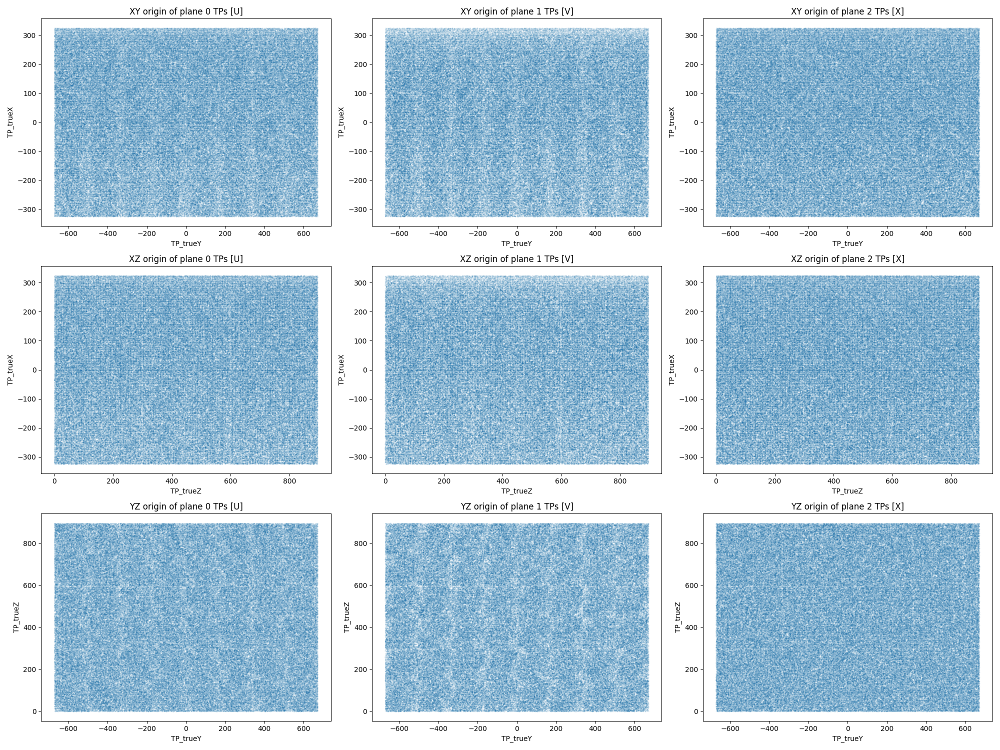

In [275]:
fig,axes= plt.subplots(3,3, figsize=(20,15))

# XY row
ax = axes[0][0]
all_tps.sig_p0.plot.scatter(x='TP_trueY', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XY origin of plane 0 TPs [U]')

ax = axes[0][1]
all_tps.sig_p1.plot.scatter(x='TP_trueY', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XY origin of plane 1 TPs [V]')

ax = axes[0][2]
all_tps.sig_p2.plot.scatter(x='TP_trueY', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XY origin of plane 2 TPs [X]')


# XZ row
ax = axes[1][0]
all_tps.sig_p0.plot.scatter(x='TP_trueZ', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XZ origin of plane 0 TPs [U]')

ax = axes[1][1]
all_tps.sig_p1.plot.scatter(x='TP_trueZ', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XZ origin of plane 1 TPs [V]')

ax = axes[1][2]
all_tps.sig_p2.plot.scatter(x='TP_trueZ', y='TP_trueX', alpha=0.05, s=1, ax=ax)
ax.set_title('XZ origin of plane 2 TPs [X]')

# YZ row
ax = axes[2][0]
all_tps.sig_p0.plot.scatter(x='TP_trueY', y='TP_trueZ', alpha=0.05, s=1, ax=ax)
ax.set_title('YZ origin of plane 0 TPs [U]')

ax = axes[2][1]
all_tps.sig_p1.plot.scatter(x='TP_trueY', y='TP_trueZ', alpha=0.05, s=1, ax=ax)
ax.set_title('YZ origin of plane 1 TPs [V]')

ax = axes[2][2]
all_tps.sig_p2.plot.scatter(x='TP_trueY', y='TP_trueZ', alpha=0.05, s=1, ax=ax)
ax.set_title('YZ origin of plane 2 TPs [X]')

fig.tight_layout()




Text(0, 0.5, 'counts')

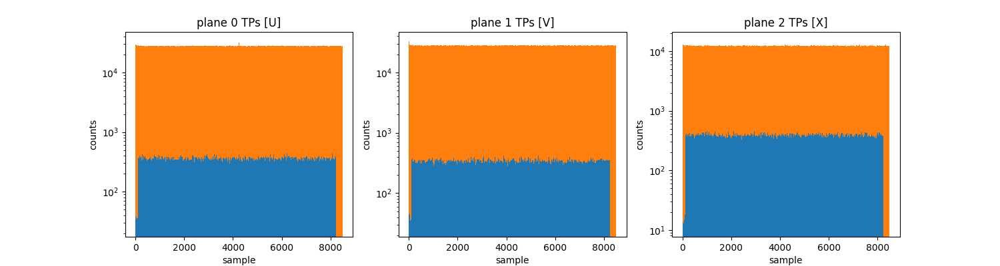

In [ ]:
fig,axes= plt.subplots(1,3, figsize=(15,4))
tps=all_tps
n_bins=8500//8

ax=axes[0]
ax.hist([tps.sig_p0.TP_peakT,tps.noise_p0.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 0 TPs [U]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')

ax=axes[1]
ax.hist([tps.sig_p1.TP_peakT,tps.noise_p1.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 1 TPs [V]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')


ax=axes[2]
ax.hist([tps.sig_p2.TP_peakT,tps.noise_p2.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 2 TPs [X]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')


In [115]:
clean_tps = TPPreSelection(pool.tps[(pool.tps.TP_startT >100) & (pool.tps.TP_startT <8000)])

Text(0, 0.5, 'counts')

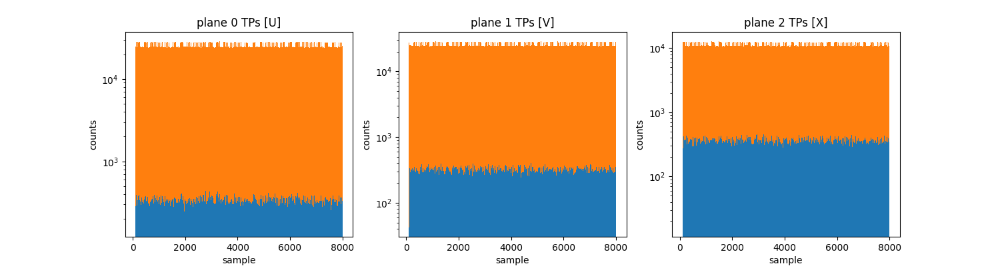

In [136]:
fig,axes= plt.subplots(1,3, figsize=(15,4))
tps=clean_tps
n_bins=8500//8

ax=axes[0]
ax.hist([tps.sig_p0.TP_peakT,tps.noise_p0.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 0 TPs [U]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')

ax=axes[1]
ax.hist([tps.sig_p1.TP_peakT,tps.noise_p1.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 1 TPs [V]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')


ax=axes[2]
ax.hist([tps.sig_p2.TP_peakT,tps.noise_p2.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 2 TPs [X]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')


In [293]:
clean_tot1_tps = TPPreSelection(pool.tps[(pool.tps.TP_startT >100) & (pool.tps.TP_startT <8000) & (pool.tps.TP_TOT > 1)])
clean_tot2_tps = TPPreSelection(pool.tps[(pool.tps.TP_startT >100) & (pool.tps.TP_startT <8000) & (pool.tps.TP_TOT > 2)])

Text(0, 0.5, 'counts')

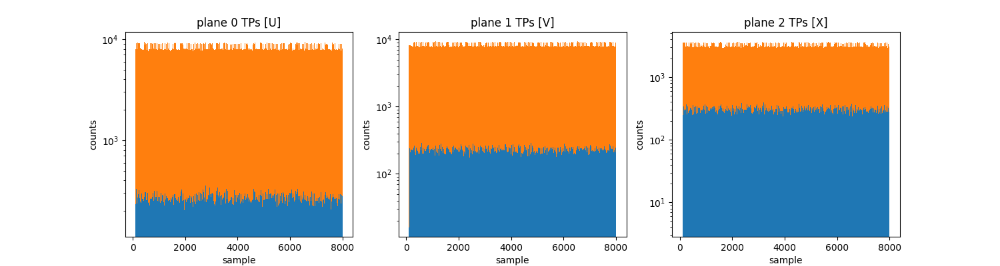

In [294]:
fig,axes= plt.subplots(1,3, figsize=(15,4))
tps=clean_tot1_tps
n_bins=8500//8

ax=axes[0]
ax.hist([tps.sig_p0.TP_peakT,tps.noise_p0.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 0 TPs [U]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')

ax=axes[1]
ax.hist([tps.sig_p1.TP_peakT,tps.noise_p1.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 1 TPs [V]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')


ax=axes[2]
ax.hist([tps.sig_p2.TP_peakT,tps.noise_p2.TP_peakT], stacked=True, bins=n_bins, log=True)
ax.set_title('plane 2 TPs [X]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')

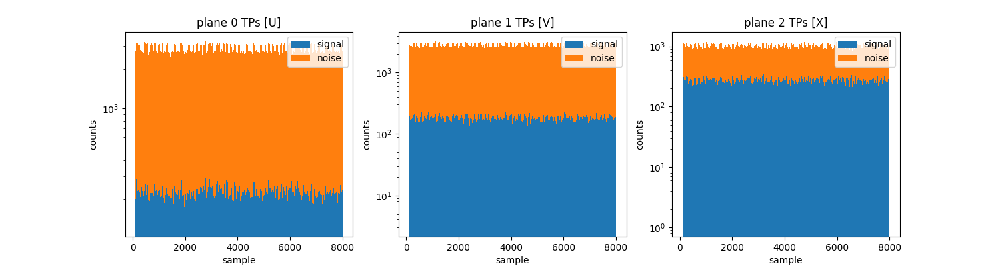

In [300]:
fig,axes= plt.subplots(1,3, figsize=(15,4))
tps=clean_tot2_tps
n_bins=8500//8

ax=axes[0]
ax.hist([tps.sig_p0.TP_peakT,tps.noise_p0.TP_peakT], stacked=True, bins=n_bins, log=True, label=['signal', 'noise'])
ax.set_title('plane 0 TPs [U]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')
ax.legend(prop={'size': 10})


ax=axes[1]
ax.hist([tps.sig_p1.TP_peakT,tps.noise_p1.TP_peakT], stacked=True, bins=n_bins, log=True, label=['signal', 'noise'])
ax.set_title('plane 1 TPs [V]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')
ax.legend(prop={'size': 10})


ax=axes[2]
ax.hist([tps.sig_p2.TP_peakT,tps.noise_p2.TP_peakT], stacked=True, bins=n_bins, log=True, label=['signal', 'noise'])
ax.set_title('plane 2 TPs [X]')
ax.set_xlabel('sample')
ax.set_ylabel('counts')
ax.legend(prop={'size': 10})


In [290]:
thresholds = [t for t in range(26, 120, 1)]


n_sig_tps = [len(clean_tps.sig_p2[(clean_tps.sig_p2.TP_peakADC > t)]) for t in thresholds]
n_noise_tps = [len(clean_tps.noise_p2[(clean_tps.noise_p2.TP_peakADC > t)]) for t in thresholds]

# n_sig_tps = [len(clean_tps.sig_p2[(clean_tps.sig_p2.TP_peakADC > t) & ( clean_tps.sig_p2.TP_TOT>2)]) for t in thresholds]
# n_noise_tps = [len(clean_tps.noise_p2[(clean_tps.noise_p2.TP_peakADC > t) & ( clean_tps.noise_p2.TP_TOT>2)]) for t in thresholds]

In [291]:
import pandas as pd 

df = pd.DataFrame({
    'threshold': thresholds,
    'n_sig': n_sig_tps,
    'n_noise': n_noise_tps
})

print(df)


threshold   n_sig   n_noise
0          26  386019  11823101
1          27  363555   8275160
2          28  344450   5727628
3          29  327745   3921808
4          30  312875   2651990
..        ...     ...       ...
89        115   19817         2
90        116   19183         2
91        117   18565         2
92        118   17993         1
93        119   17435         1

[94 rows x 3 columns]

,threshold,n_sig,n_noise,sig_frac,noise_frac,noise_dominance,purity,completeness
0,26,386019,11823101,1.000000,1.000000e+00,30.628288,0.031617,1.000000
1,27,363555,8275160,0.941806,6.999145e-01,22.761783,0.042084,0.941806
2,28,344450,5727628,0.892314,4.844438e-01,16.628329,0.056727,0.892314
3,29,327745,3921808,0.849039,3.317072e-01,11.966035,0.077125,0.849039
4,30,312875,2651990,0.810517,2.243058e-01,8.476197,0.105528,0.810517
...,...,...,...,...,...,...,...,...
89,115,19817,2,0.051337,1.691604e-07,0.000101,0.999899,0.051337
90,116,19183,2,0.049694,1.691604e-07,0.000104,0.999896,0.049694
91,117,18565,2,0.048093,1.691604e-07,0.000108,0.999892,0.048093
92,118,17993,1,0.046612,8.458018e-08,0.000056,0.999944,0.046612


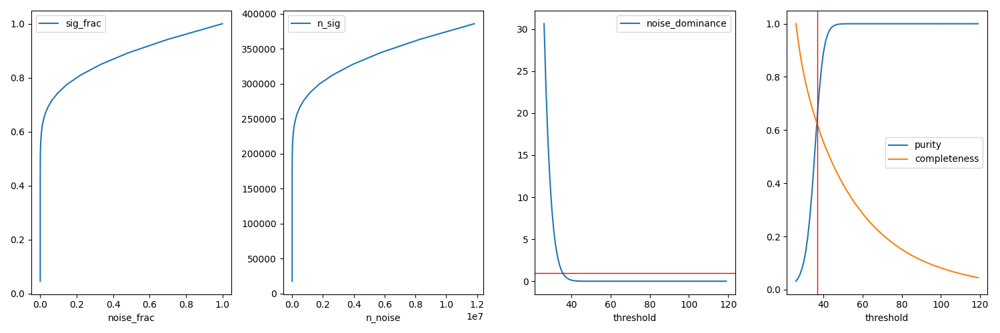

In [408]:
fig,axes= plt.subplots(1,4, figsize=(15,5))

df['sig_frac'] = df.n_sig/len(clean_tps.sig_p2)
df['noise_frac'] = df.n_noise/len(clean_tps.noise_p2)
df['noise_dominance'] = df.n_noise/df.n_sig
df['purity'] = df.n_sig/(df.n_noise+df.n_sig)
df['completeness'] = df.n_sig/len(clean_tps.sig_p2)



ax=axes[0]
df.plot(x='noise_frac', y='sig_frac', ax=ax)
ax=axes[1]
df.plot(x='n_noise', y='n_sig', ax=ax)
ax=axes[2]
df.plot(x='threshold', y='noise_dominance', ax=ax)
ax.axhline(1, color='r', lw=1)
ax=axes[3]
df.plot(x='threshold', y='purity', ax=ax)
# ax=axes[4]
df.plot(x='threshold', y='completeness', ax=ax)
ax.axvline(37, color='r', lw=1)

display(df)

fig.tight_layout()


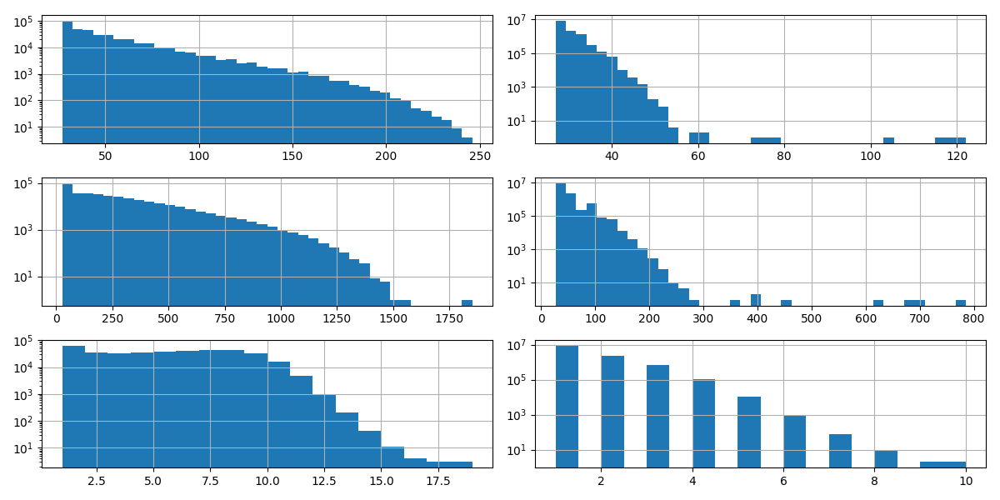

In [ ]:
fig, axes= plt.subplots(3,2, figsize=(12,6))

ax=axes[0][0]
clean_tps.sig_p2.TP_peakADC.hist(ax=ax, bins=40, log=True)
ax=axes[0][1] 
clean_tps.noise_p2.TP_peakADC.hist(ax=ax, bins=40, log=True)

ax=axes[1][0]
clean_tps.sig_p2.TP_SADC.hist(ax=ax, bins=40, log=True)
ax=axes[1][1] 
clean_tps.noise_p2.TP_SADC.hist(ax=ax, bins=40, log=True)

ax=axes[2][0]
clean_tps.sig_p2.TP_TOT.hist(ax=ax, bins=18, log=True)
ax=axes[2][1] 
clean_tps.noise_p2.TP_TOT.hist(ax=ax, bins=18, log=True)

fig.tight_layout()

In [244]:
n_ar39 = 0

for ev, g in pool.ides.groupby(by='event'):
    n_ar39 += len(g.track_id.unique())
print(n_ar39)

484267

In [ ]:
pool.ides.groupby(by='event')['track_id'].nunique().sum()

np.int64(484267)

In [356]:
n_bins_peak = clean_tps.sig_p2.TP_peakADC.max()-clean_tps.sig_p2.TP_peakADC.min()
print(n_bins_peak)

219

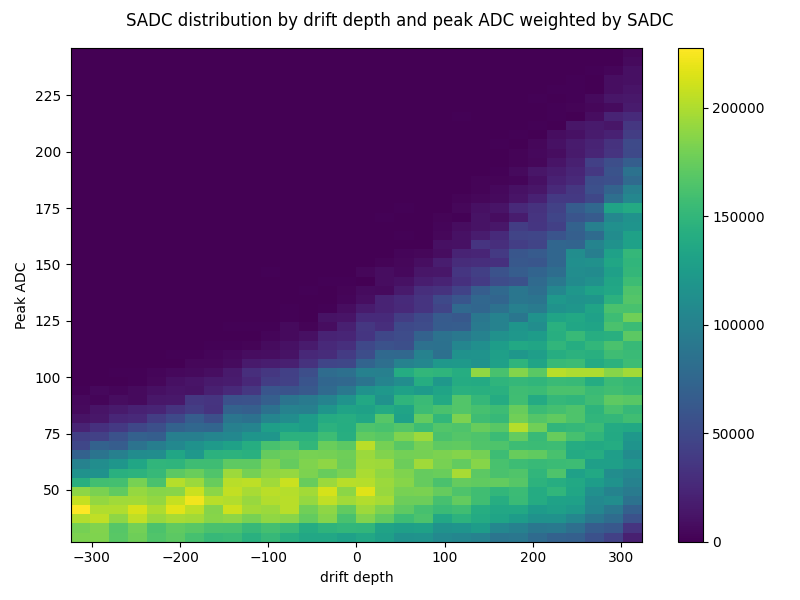

In [ ]:
fig, ax= plt.subplots(1,1, figsize=(8,6))

n_bins_y = clean_tps.sig_p2.TP_peakADC.max()-clean_tps.sig_p2.TP_peakADC.min()
h2 = ax.hist2d(clean_tps.sig_p2.TP_trueX, clean_tps.sig_p2.TP_peakADC, weights=clean_tps.sig_p2.TP_SADC, bins=(30, n_bins_y//4))
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("drift depth")
ax.set_ylabel("Peak ADC")
fig.suptitle("SADC distribution by drift depth and peak ADC weighted by SADC")
fig.tight_layout()

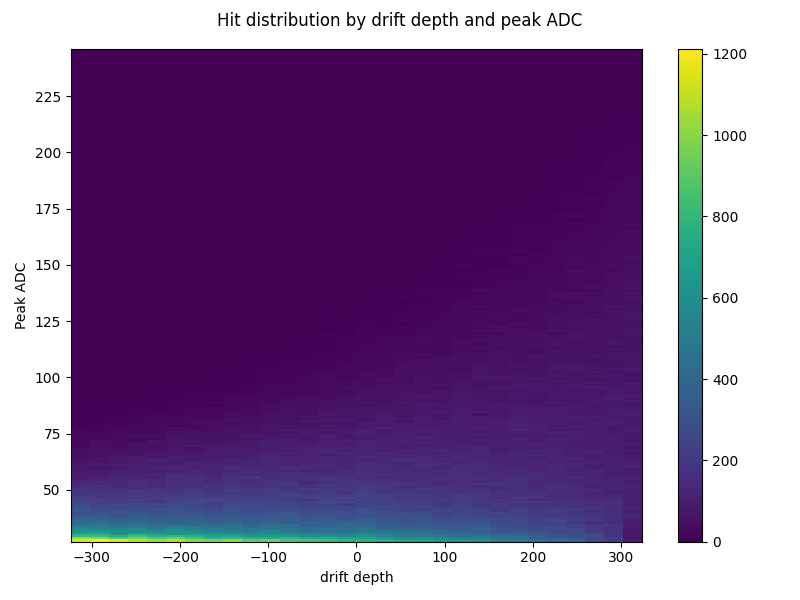

In [ ]:
fig, ax= plt.subplots(1,1, figsize=(8,6))

n_bins_y = clean_tps.sig_p2.TP_peakADC.max()-clean_tps.sig_p2.TP_peakADC.min()
h2 = ax.hist2d(clean_tps.sig_p2.TP_trueX, clean_tps.sig_p2.TP_peakADC, bins=(30, n_bins_y//1))
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("drift depth")
ax.set_ylabel("Peak ADC")
fig.suptitle("Hit distribution by drift depth and peak ADC")
fig.tight_layout()

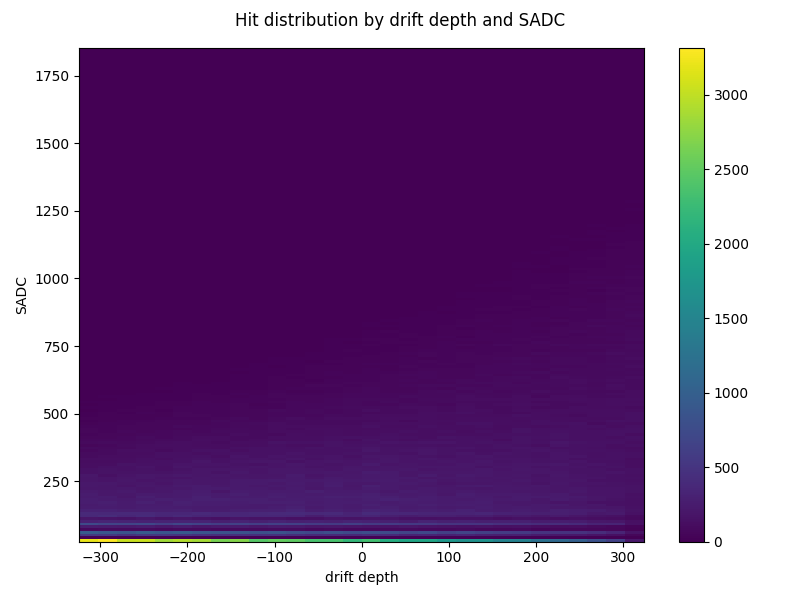

In [412]:
fig, ax= plt.subplots(1,1, figsize=(8,6))
# clean_tps.sig_p2[clean_tps.sig_p2.TP_peakADC < 150].TP_trueX.hist(bins=30)

n_bins_peak = clean_tps.sig_p2.TP_SADC.max()-clean_tps.sig_p2.TP_SADC.min()
h2 = ax.hist2d(clean_tps.sig_p2.TP_trueX, clean_tps.sig_p2.TP_SADC, bins=(30, n_bins_peak//10))
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("drift depth")
ax.set_ylabel("SADC")
fig.suptitle("Hit distribution by drift depth and SADC")
fig.tight_layout()

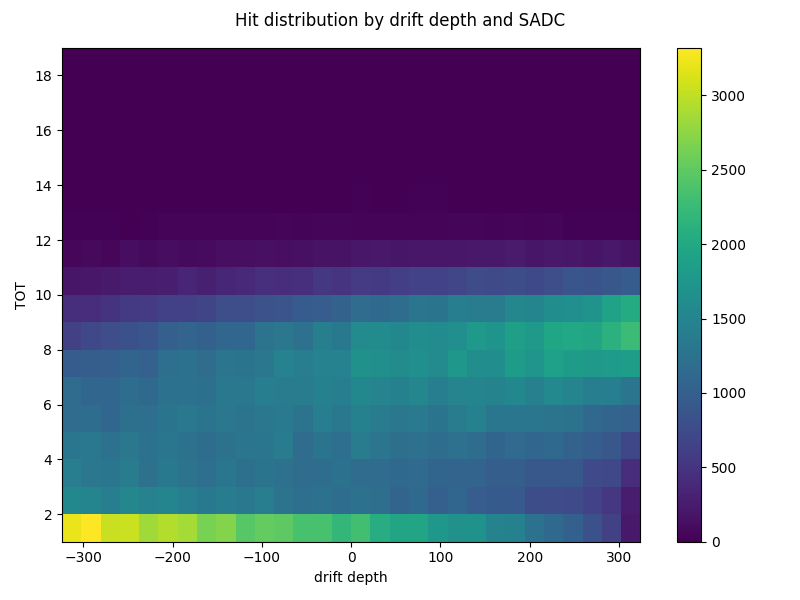

In [430]:
fig, ax= plt.subplots(1,1, figsize=(8,6))

n_bins_y = clean_tps.sig_p2.TP_TOT.max()-clean_tps.sig_p2.TP_TOT.min()
h2 = ax.hist2d(clean_tps.sig_p2.TP_trueX, clean_tps.sig_p2.TP_TOT, bins=(30, n_bins_y//1))
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("drift depth")
ax.set_ylabel("TOT")
fig.suptitle("Hit distribution by drift depth and SADC")
fig.tight_layout()

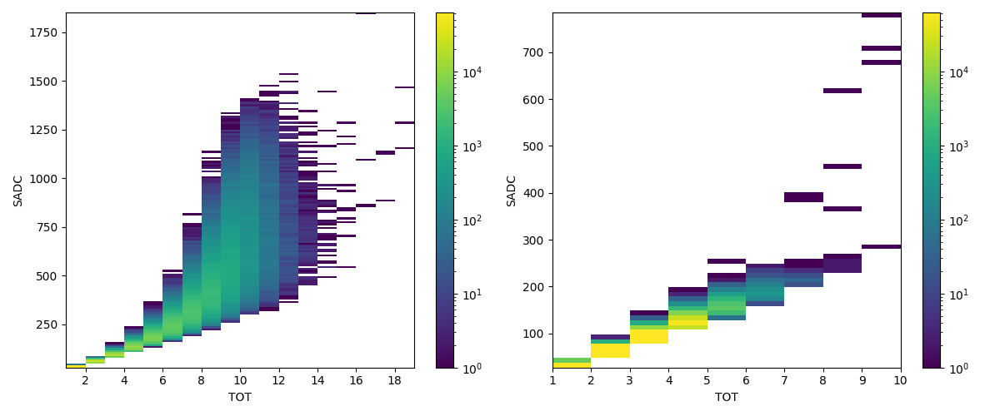

In [432]:
import matplotlib as mpl
fig, axes= plt.subplots(1,2, figsize=(12,5))
# clean_tps.sig_p2[clean_tps.sig_p2.TP_peakADC < 150].TP_trueX.hist(bins=30)

norm=mpl.colors.LogNorm()

ax = axes[0]
n_bins_y = clean_tps.sig_p2.TP_SADC.max()-clean_tps.sig_p2.TP_SADC.min()
n_bins_x = clean_tps.sig_p2.TP_TOT.max()-clean_tps.sig_p2.TP_TOT.min()
h2 = ax.hist2d(clean_tps.sig_p2.TP_TOT, clean_tps.sig_p2.TP_SADC, bins=(n_bins_x, n_bins_y//10), norm=norm)
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("TOT")
ax.set_ylabel("SADC")
# fig.suptitle("Hit distribution by drift depth and SADC")

ax = axes[1]
n_bins_y = clean_tps.noise_p2.TP_SADC.max()-clean_tps.noise_p2.TP_SADC.min()
n_bins_x = clean_tps.noise_p2.TP_TOT.max()-clean_tps.noise_p2.TP_TOT.min()
h2 = ax.hist2d(clean_tps.noise_p2.TP_TOT, clean_tps.noise_p2.TP_SADC, bins=(n_bins_x, n_bins_y//10), norm=norm)
fig.colorbar(h2[3], ax=ax)
ax.set_xlabel("TOT")
ax.set_ylabel("SADC")

fig.tight_layout()

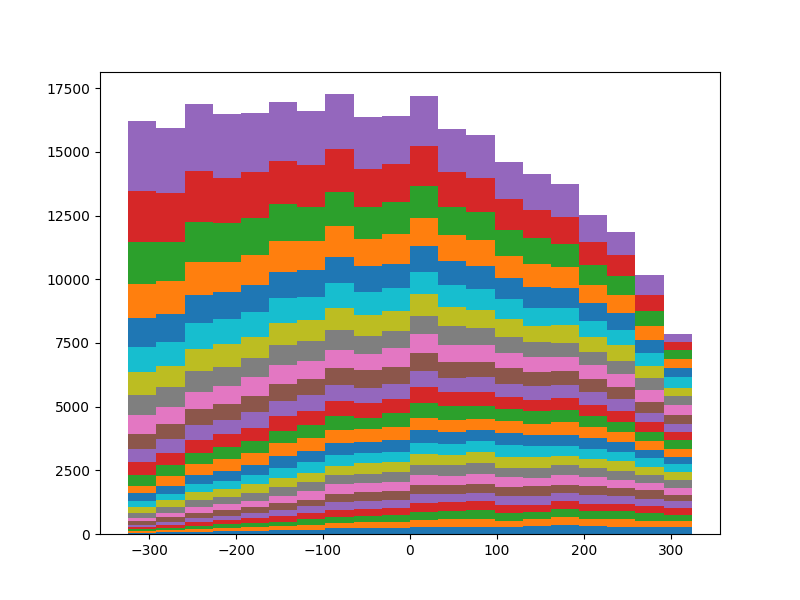

In [457]:
fig, ax= plt.subplots(1,1, figsize=(8,6))

tps_p2 = clean_tps.sig_p2
th_0=tps_p2.TP_peakADC.min()
step = 2
hists = [
    tps_p2[
        (tps_p2.TP_peakADC > k) &
        (tps_p2.TP_peakADC <= k+2)
    ].TP_trueX
    for k in range(th_0,th_0+50,2)
    ]

h = ax.hist(
    list(reversed(hists)),
    bins=20,
    density=False,
    stacked=True,
)

# ax.hist([
#     tps_c[tps_c.TP_mcgen_id == 4].TP_SADC, 
#     tps_c[tps_c.TP_mcgen_id == 9].TP_SADC, 
#     tps_c[tps_c.TP_mcgen_id == 26].TP_SADC, 
#     ], 
#     bins=100, 
#     density=False,
#     color=['blue', 'yellow', 'red'],
#     label=['"Ar39"', '"Gamma"', '"Kr"'], 
#     stacked=True,
#     alpha=1)

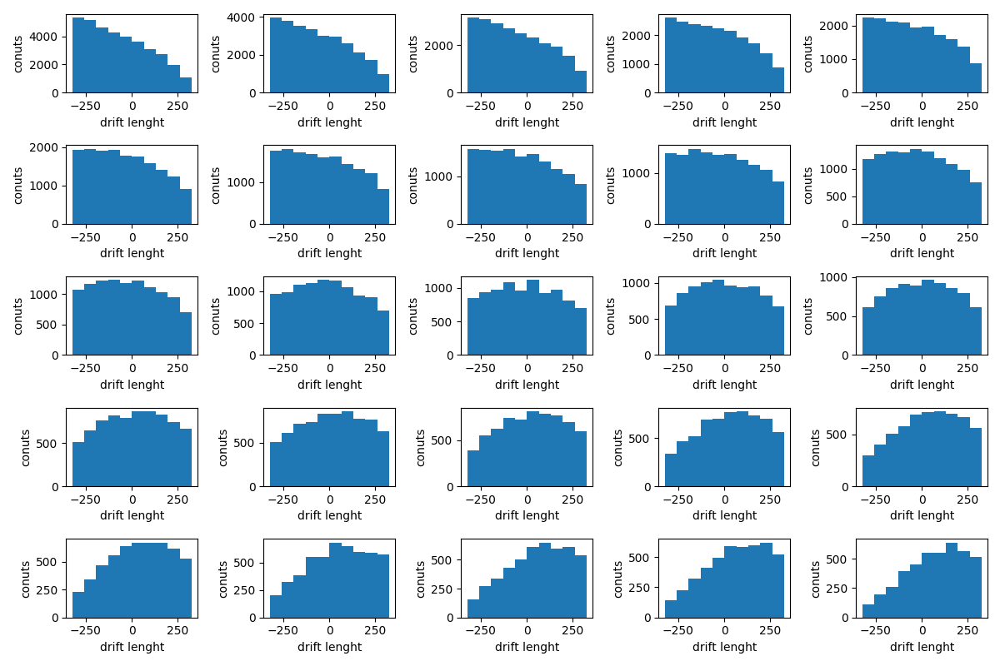

In [461]:
fig, axes = subplot_autogrid(len(hists), figsize=(12,8))


for i,h in enumerate(hists):
    ax=axes[i]
    ax.hist(h)
    ax.set_xlabel('drift lenght')
    ax.set_ylabel('conuts')


fig.tight_layout()

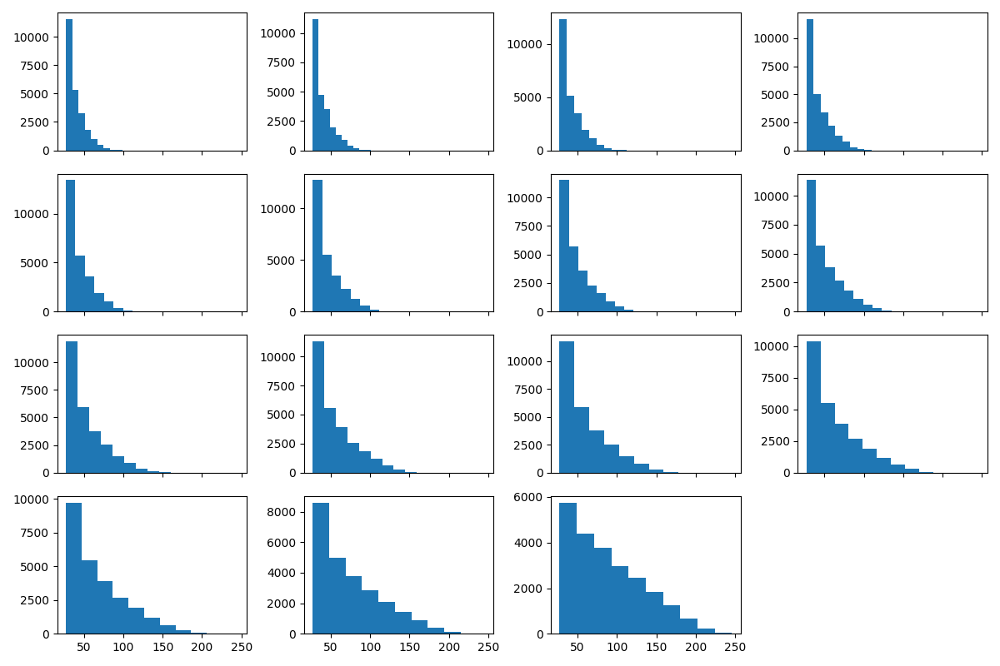

In [501]:
tps_p2 = clean_tps.sig_p2
xmin = tps_p2.TP_trueX.min()
xmax = tps_p2.TP_trueX.max()
n_slices = 15
dx=(xmax-xmin)/n_slices

slices = [
    tps_p2[
        (tps_p2.TP_trueX > xmin+dx*i) &
        (tps_p2.TP_trueX <= xmin+dx*(i+1))
    ]
    for i in range(n_slices)
    ]


fig, axes = subplot_autogrid(len(slices), figsize=(12,8), sharex=True)

for i,sl in enumerate(slices):
    ax=axes[i]
    ax.hist(sl.TP_peakADC)
    ax.set

fig.tight_layout()
    


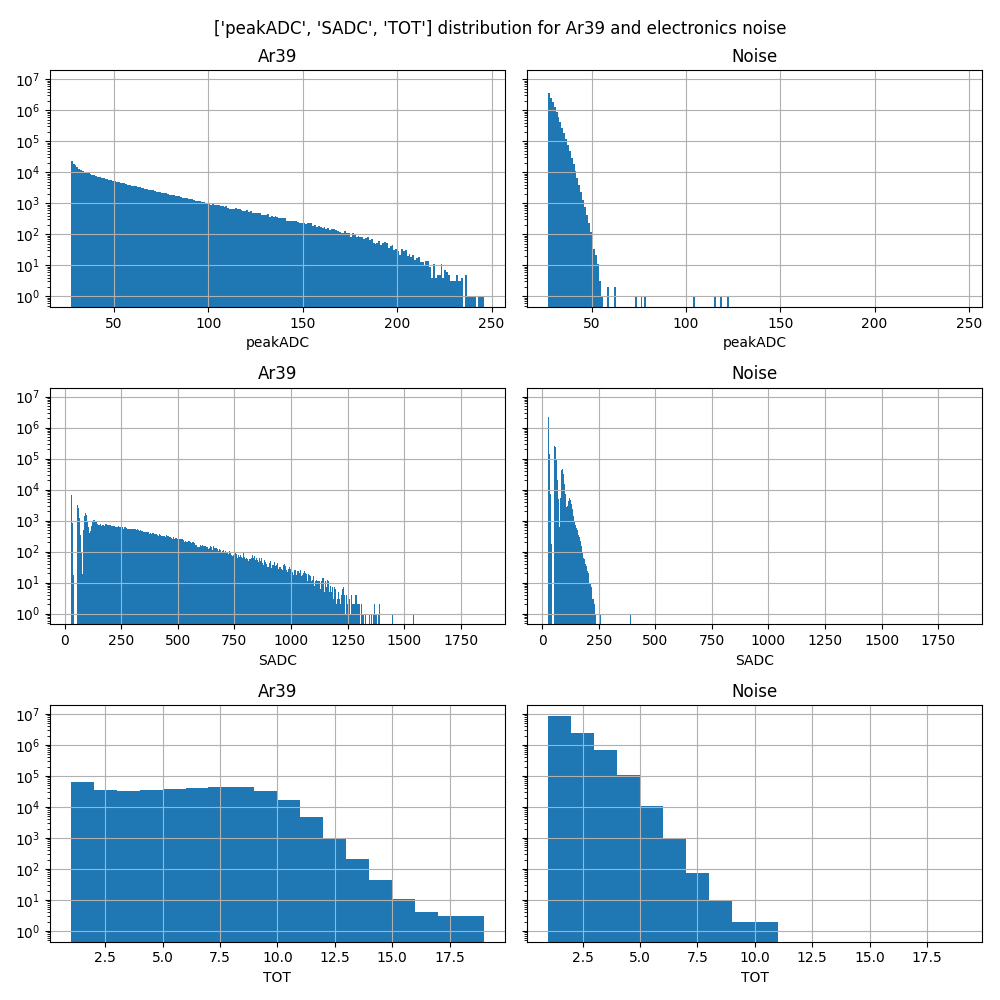

In [497]:
fig, axes= plt.subplots(3,2, figsize=(10,10), sharey=True)


# var='peakADC'

var_list = ['peakADC', 'SADC', 'TOT']
for i,var in enumerate(var_list):
    col = f'TP_{var}'

    x_min=clean_tps.p2[col].min()
    x_max=clean_tps.p2[col].max()

    dx=(x_max-x_min)
    n_bins=int(dx)
    # n_bins=100

    binw = dx/n_bins
    bins = [ (x_min + i*binw) for i in range(n_bins+1)]

    ax=axes[i][0]
    clean_tps.sig_p2[col].hist(bins=bins, ax=ax,log=True)
    ax.set_xlabel(f"{var}")
    ax.set_title("Ar39")
    ax = axes[i][1]
    clean_tps.noise_p2[col].hist(bins=bins, ax=ax,log=True)
    ax.set_xlabel(f"{var}")
    ax.set_title("Noise")

fig.suptitle(f"{var_list} distribution for Ar39 and electronics noise")
fig.tight_layout()

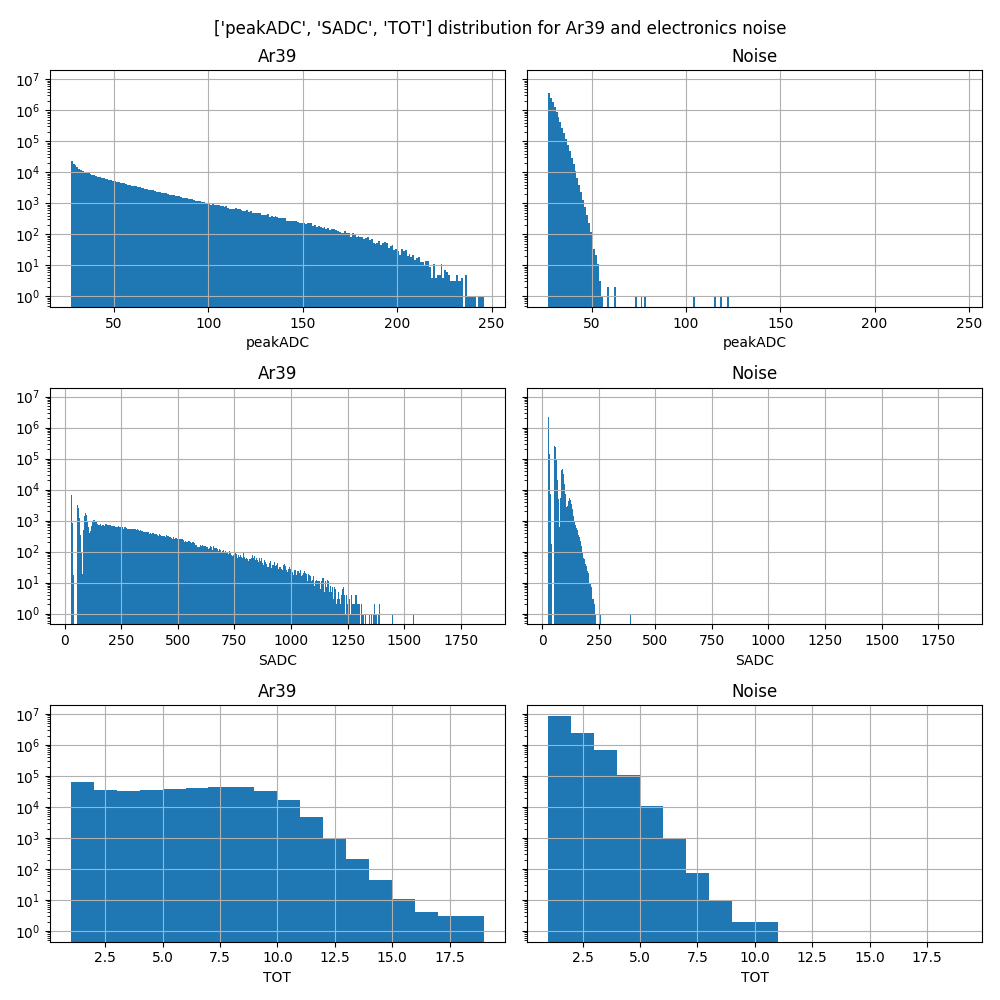

In [ ]:
fig, axes= plt.subplots(3,1, figsize=(10,10), sharey=True)


# var='peakADC'

var_list = ['peakADC', 'SADC', 'TOT']
for i,var in enumerate(var_list):
    col = f'TP_{var}'

    x_min=clean_tps.p2[col].min()
    x_max=clean_tps.p2[col].max()

    dx=(x_max-x_min)
    n_bins=int(dx)
    # n_bins=100

    binw = dx/n_bins
    bins = [ (x_min + i*binw) for i in range(n_bins+1)]

    ax=axes[i][0]
    clean_tps.sig_p2[col].hist(bins=bins, ax=ax,log=True)
    ax.set_xlabel(f"{var}")
    ax.set_title("Ar39")
    ax = axes[i][1]
    clean_tps.noise_p2[col].hist(bins=bins, ax=ax,log=True)
    ax.set_xlabel(f"{var}")
    ax.set_title("Noise")

fig.suptitle(f"{var_list} distribution for Ar39 and electronics noise")
fig.tight_layout()

In [ ]:
].hist(bins=bins, ax=ax,log=True)
ax.set_xlabel("TOT")
ax = axes[1]
clean_tps.noise_p2[var

In [ ]:
].hist(bins=bins, ax=ax,log=True)
ax.set_xlabel("TOT")

fig.suptitle("TOT distribution for Ar39 and electronics noise")
fig.tight_layout()